# Generated figures — test4

Shows every figure in a generation run, with its type, distribution and pixel grid.**Real sky images are shown next to the 300x300 cutout they came from.** Thegenerator downloads a cutout at 300x300, crops it (centred) to the requestedaspect, then takes every k-th pixel — so the plotted array is made of *original*pixel values, never interpolated. The red box on the original marks the crop,and the caption gives the decimation factor.Point `TEST_DIR` at any run directory (`test1`, `test2`, ...) to reuse this.

In [1]:
import os, json, glob
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.patches import Rectangle

# --- where to look -----------------------------------------------------------
TEST_DIR = os.path.expanduser('~/Dropbox/WASP2026/tests/test4')

# cache the real sky cutouts were downloaded to; only needed for 'sky' figures.
# the generator records the filename, so this just has to point at the dir.
ASTROQUERY_DIR = os.path.expanduser(
    os.environ.get('SKYFIGS_ASTROQUERY_IMAGES',
                   '~/Dropbox/wwt_image_extraction/FullProcess_resources/astroquery_images/'))

print('figures :', TEST_DIR)
print('cutouts :', ASTROQUERY_DIR)

figures : /Users/jnaiman/Dropbox/WASP2026/tests/test4
cutouts : /Users/jnaiman/Dropbox/wwt_image_extraction/FullProcess_resources/astroquery_images/


## Load the records

In [2]:
def load_records(test_dir):
    """One dict per generated figure: image path, plot type, grid, sky provenance."""
    recs = []
    for jf in sorted(glob.glob(os.path.join(test_dir, 'jsons', '*.json'))):
        name = os.path.splitext(os.path.basename(jf))[0]
        with open(jf) as f:
            d = json.loads(json.load(f))          # the json is double-encoded

        img = None
        for ext in ('jpeg', 'jpg', 'png'):
            p = os.path.join(test_dir, 'imgs', name + '.' + ext)
            if os.path.exists(p):
                img = p
                break

        panels = [k for k in d if k.startswith('plot')]
        p0 = d[panels[0]]
        colors = np.asarray(p0['data']['colors'])
        grid = (colors.shape[1], colors.shape[0]) if colors.ndim == 2 else None

        dparams = p0['data'].get('data params') or {}
        sky = dparams.get('sky image params')          # only real cutouts have this

        recs.append(dict(name=name, json=jf, img=img,
                         ptype=p0.get('type'), dist=p0.get('distribution'),
                         npanels=len(panels), grid=grid,
                         figure=d.get('figure', {}),
                         sky=sky,
                         wcs_fetched=dparams.get('WCS header string (fetched)'),
                         wcs_plotted=dparams.get('WCS header string')))
    return recs


records = load_records(TEST_DIR)
print('%d figures\n' % len(records))
print('%-10s %-18s %-12s %-11s %s' % ('figure', 'type', 'distribution', 'grid', 'from'))
for r in records:
    src = os.path.basename(r['sky']['filename']) if r['sky'] else ''
    print('%-10s %-18s %-12s %-11s %s' % (
        r['name'].replace('Picture_', ''), r['ptype'], r['dist'],
        '%dx%d' % r['grid'] if r['grid'] else '-', src[:52]))

15 figures

figure     type               distribution grid        from
000001     contour            random       100x164     
000002     contour            random       58x57       
000003     contour            linear       236x282     
000004     contour            random       161x156     
000005     contour            gmm          91x68       
000006     image of the sky   gmm          40x29       
000007     image of the sky   gmm          92x165      
000008     image of the sky   gmm          41x36       
000009     image of the sky   gmm          288x263     
000010     image of the sky   gmm          203x146     
000011     image of the sky   sky          265x300     image_1996ApJS__107__239T_OBJ_NVSS_J211051+491353_SU
000012     image of the sky   sky          277x189     image_1984ApJS___56__393H_OBJ_US_2545_SURVEY_Melling
000013     image of the sky   sky          88x70       image_1988AJ_____95_1755J_OBJ_JW__377_SURVEY_DSS1_Bl
000014     image of the sky   sky          2

## Plot each figureReal sky images get their source cutout beside them; everything else is shown onits own. `is_real_sky` keys off the recorded provenance rather than thedistribution name, so a figure is only paired with a cutout when the file thatproduced it is actually on disk.

In [3]:
def is_real_sky(rec):
    """True when this figure came from a downloaded cutout we can still find."""
    sky = rec['sky']
    if not sky or not sky.get('filename'):
        return False
    return os.path.exists(os.path.join(ASTROQUERY_DIR, sky['filename']))


def load_cutout(rec):
    """The original .fits as downloaded, plus its WCS. None if unreadable."""
    from astropy.io import fits
    path = os.path.join(ASTROQUERY_DIR, rec['sky']['filename'])
    try:
        with fits.open(path) as hdul:
            data = np.array(hdul[0].data, dtype=float)
    except Exception as e:
        print('  could not read %s: %s' % (path, e))
        return None
    return np.nan_to_num(data, nan=0.0, posinf=0.0, neginf=0.0)


def stretch(a, percent=99):
    """Display scaling only -- matches how the generator renders these."""
    try:
        from astropy.visualization import simple_norm
        return simple_norm(a, 'log', percent=percent)
    except Exception:
        return None

In [4]:
def show(rec, figwidth=13):
    """One row: the generated figure, and for real sky its source cutout."""
    paired = is_real_sky(rec)
    ncols = 2 if paired else 1
    fig, axes = plt.subplots(1, ncols, figsize=(figwidth, figwidth / (2.1 if paired else 1.7)))
    axes = np.atleast_1d(axes)

    # --- the generated figure, exactly as saved -------------------------------
    ax = axes[0]
    if rec['img']:
        ax.imshow(plt.imread(rec['img']))
    ax.set_axis_off()
    grid = '%dx%d' % rec['grid'] if rec['grid'] else '?'
    ax.set_title('%s\n%s / %s  |  grid %s' % (rec['name'], rec['ptype'], rec['dist'], grid),
                 fontsize=11)

    # --- the cutout it was built from ----------------------------------------
    if paired:
        ax = axes[1]
        raw = load_cutout(rec)
        if raw is not None:
            ax.imshow(raw, origin='lower', cmap='viridis', norm=stretch(raw))
            t = (rec['sky'] or {}).get('resample transform') or {}
            if t:
                x0, y0 = t['crop origin (x0,y0)']
                w, h = t['crop size (w,h)']
                ax.add_patch(Rectangle((x0 - 0.5, y0 - 0.5), w, h,
                                       fill=False, ec='red', lw=2))
                sub = 'crop %dx%d at (%d,%d), every %d%s px' % (
                    w, h, x0, y0, t['decimation k'],
                    ' ' if t['decimation k'] == 1 else 'th')
            else:
                sub = ''
            sky = rec['sky']
            ax.set_title('original cutout %dx%d  (red = region used)\n%s | %s\n%s' % (
                raw.shape[1], raw.shape[0],
                sky.get('object', '?'),
                (sky.get('survey') or ['?'])[0] if isinstance(sky.get('survey'), list) else sky.get('survey'),
                sub), fontsize=10)
        ax.set_axis_off()

    plt.tight_layout()
    plt.show()

### Contour

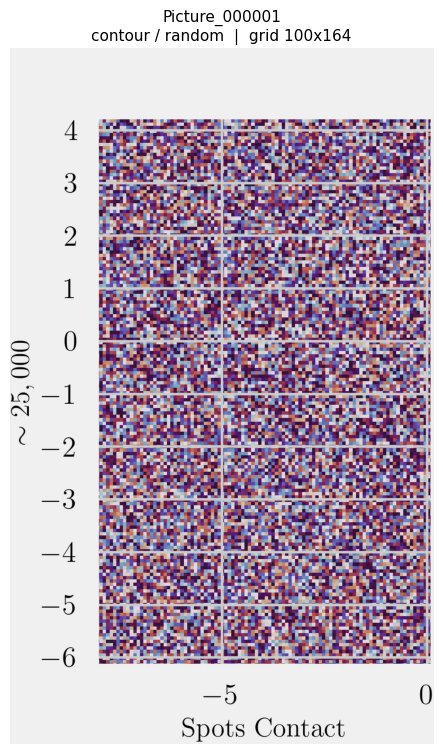

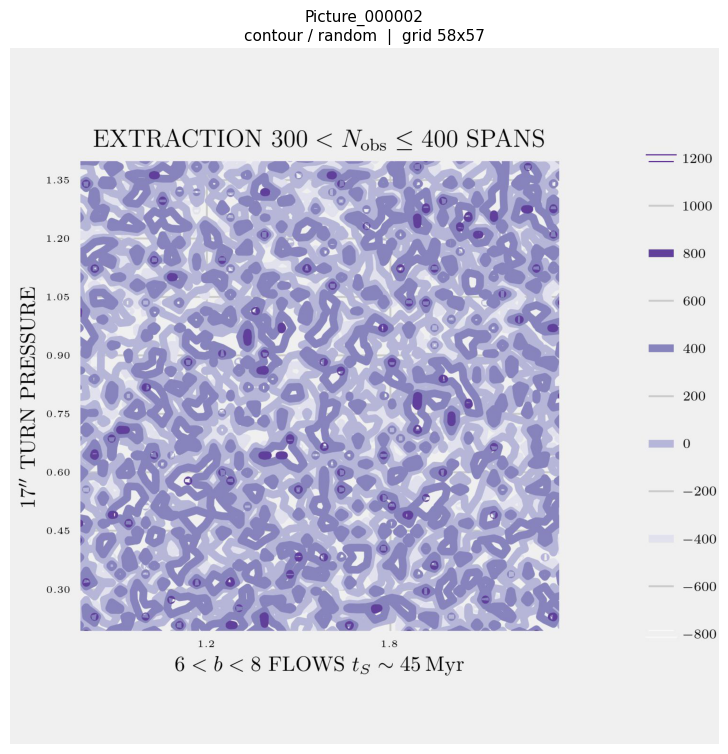

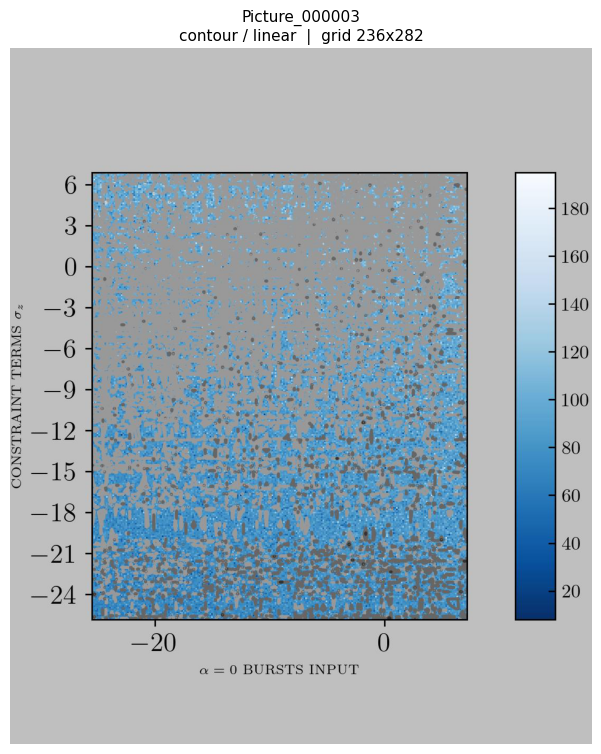

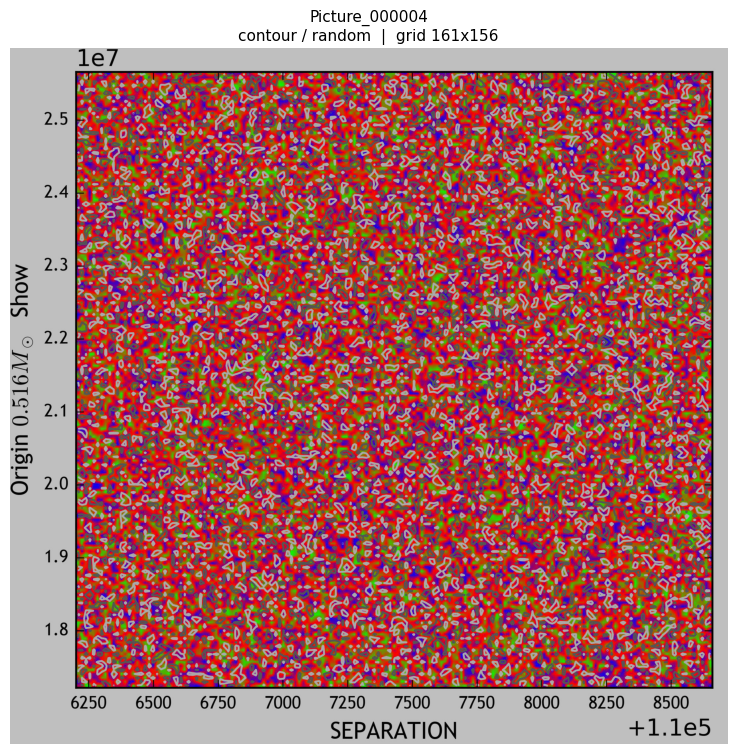

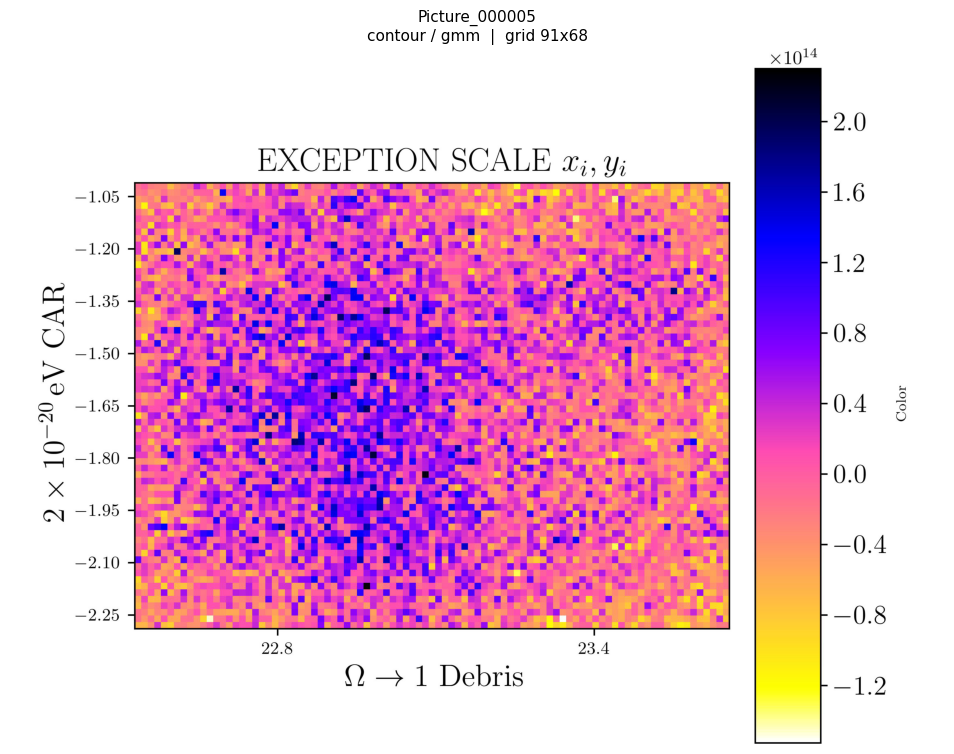

In [5]:
for r in [r for r in records if r['ptype'] == 'contour']:
    show(r)

### Image of the sky — synthetic (GMM)

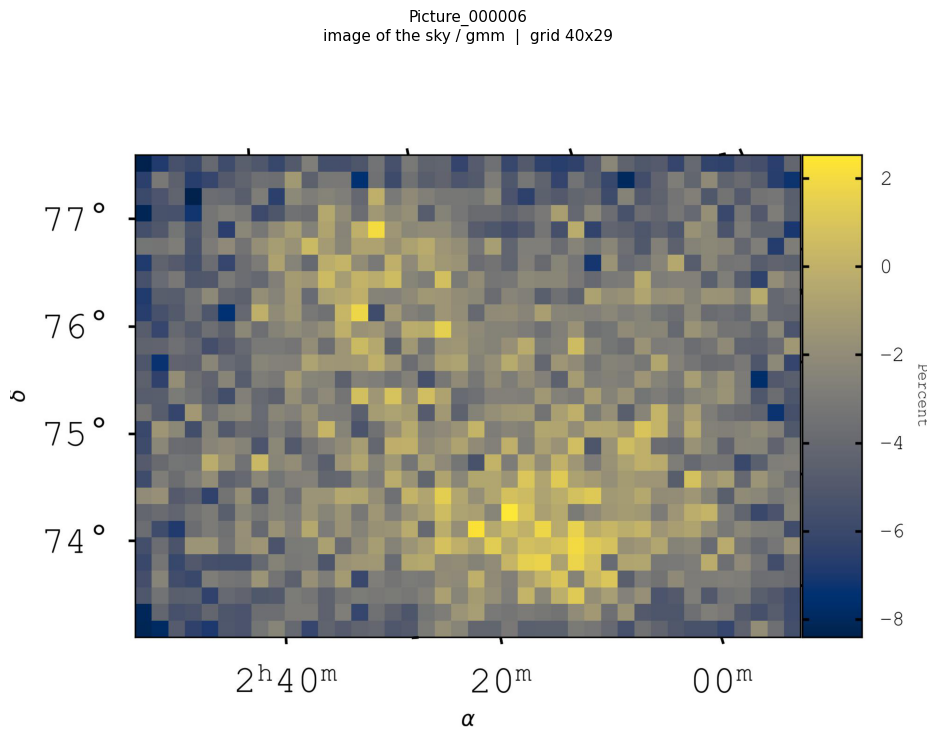

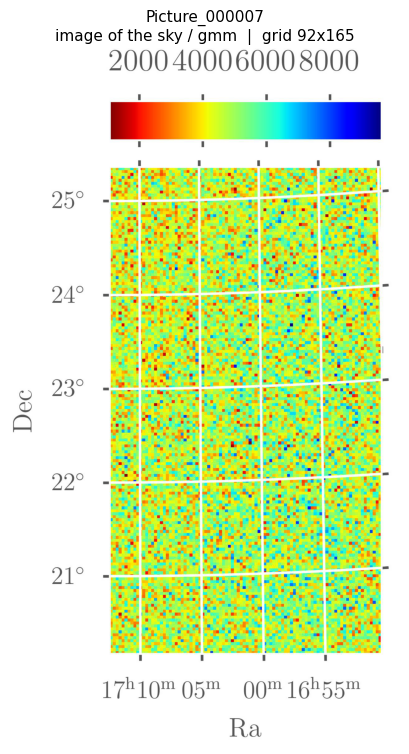

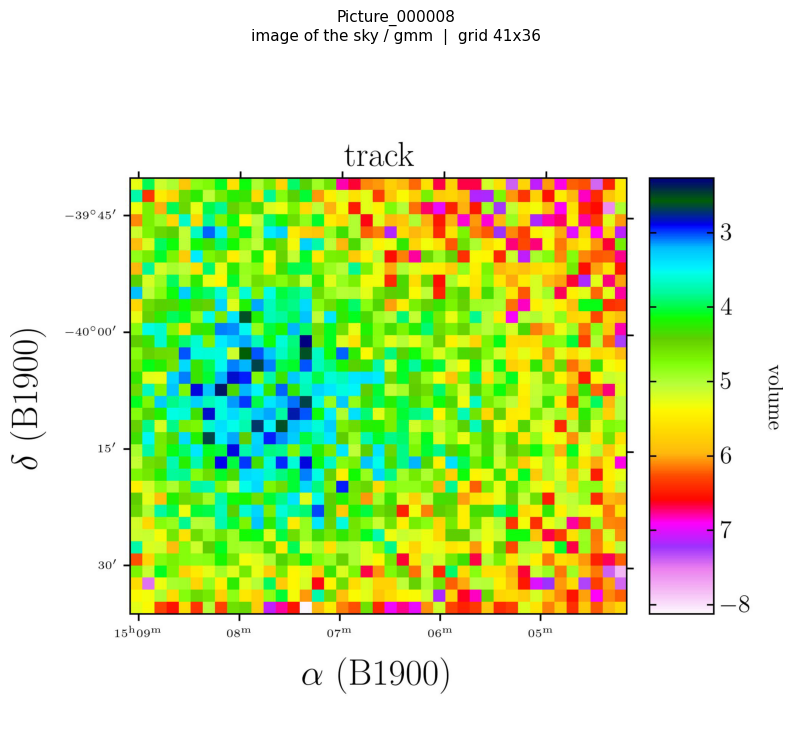

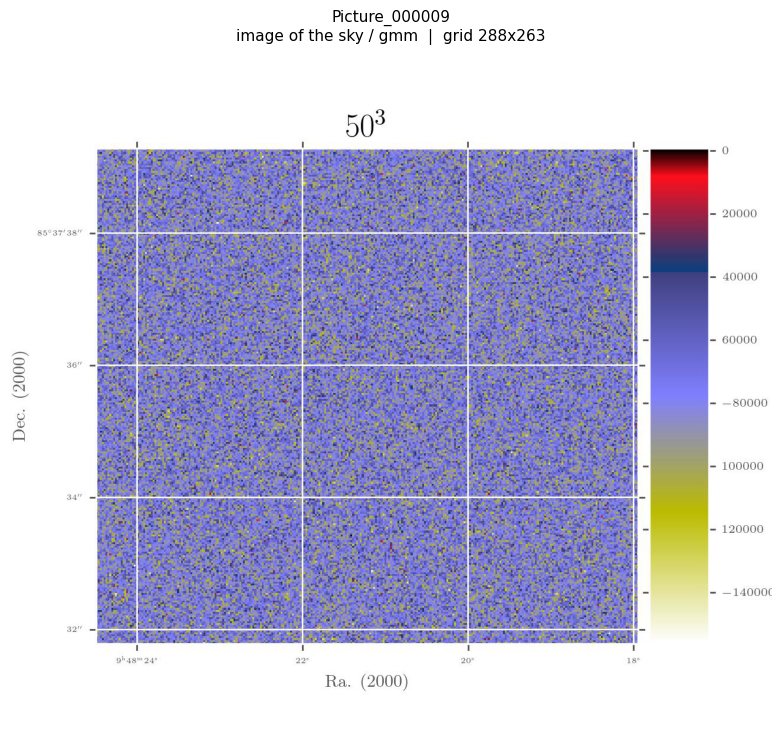

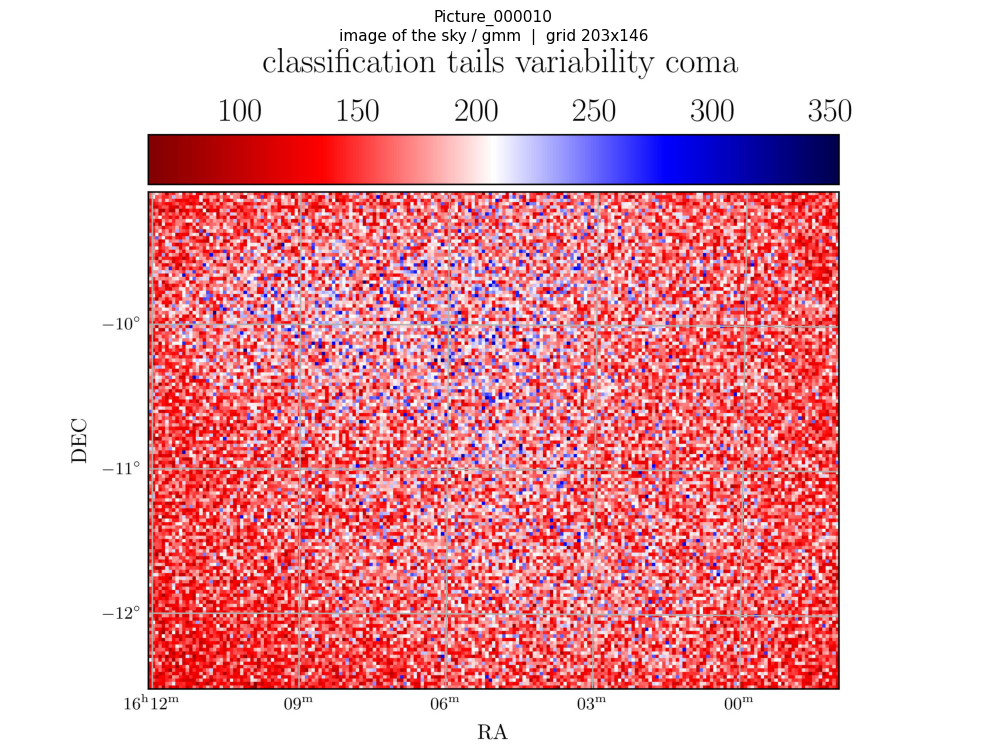

In [6]:
for r in [r for r in records if r['ptype'] == 'image of the sky' and not is_real_sky(r)]:
    show(r)

### Image of the sky — real cutoutsEach is shown beside the 300x300 file it was built from, with the crop outlined.

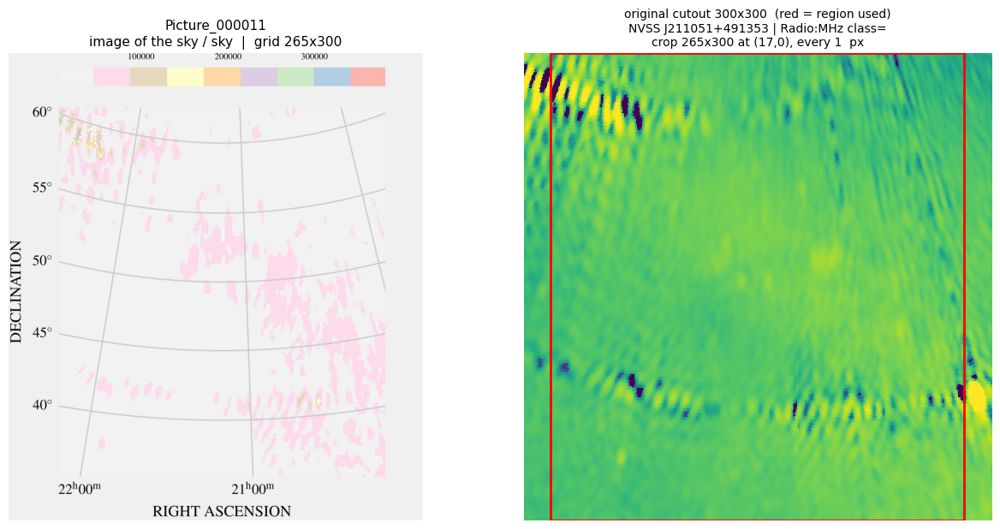

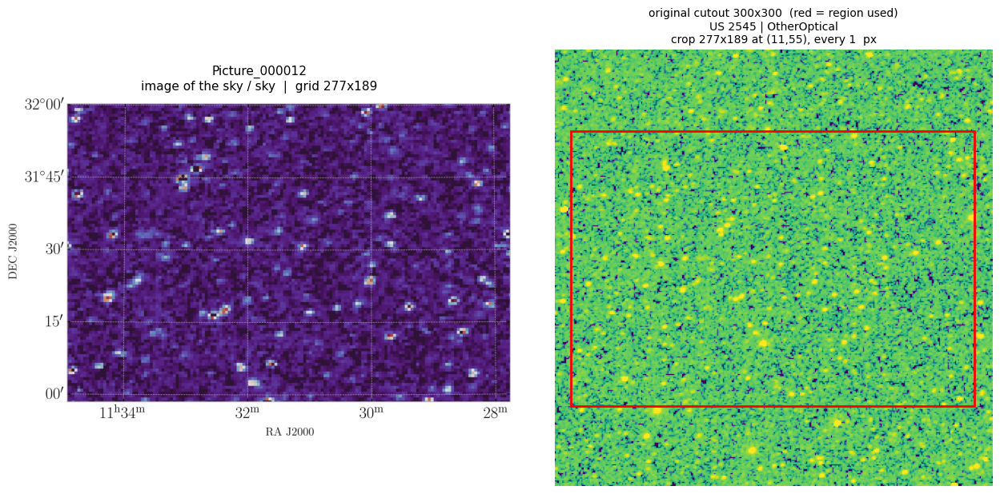

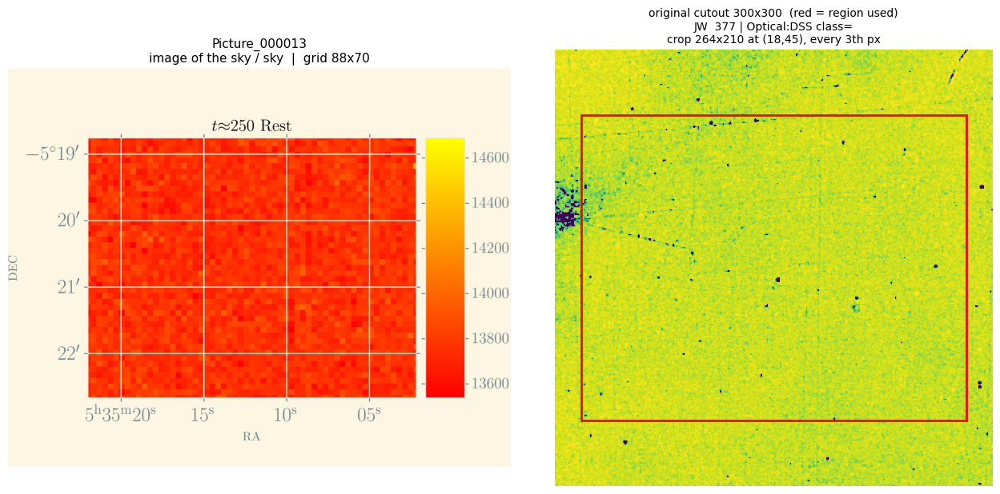

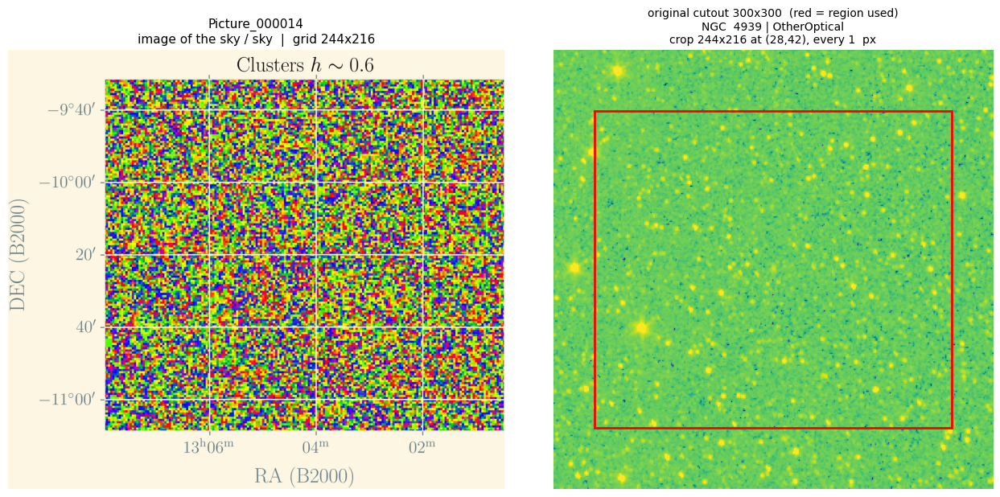

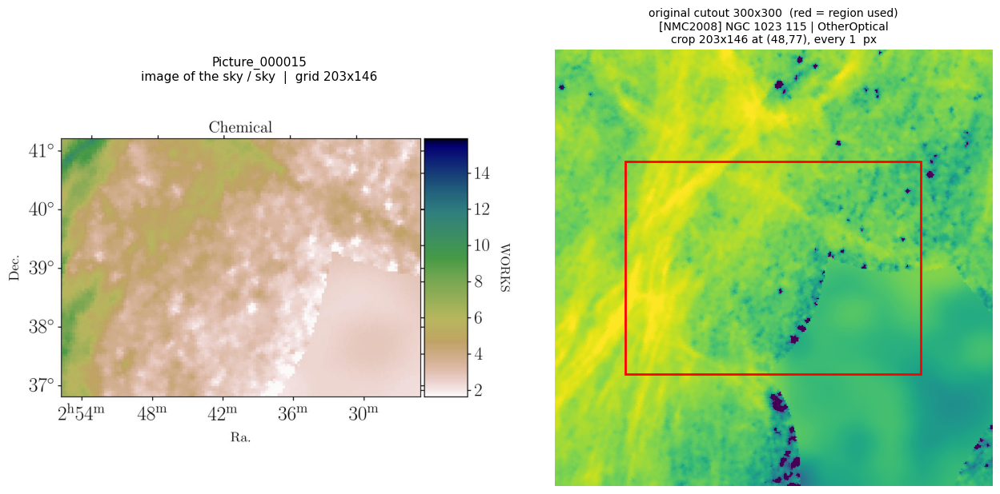

In [7]:
for r in [r for r in records if is_real_sky(r)]:
    show(r)

## Check: are the plotted pixels really the original ones?

Re-derives the plotted array straight from the `.fits` using the recorded crop
origin, decimation factor and sample offset, then compares.

The **shape must match exactly** and the vast majority of pixels should be
bitwise identical -- the generator decimates, it never interpolates. A small
tail (~0.5%) does differ: after decimation the values pass through
`simple_norm(..., percent=99)` forward and inverse, which trims half a percent
off each end of the distribution. That is a display-stretch artefact in the
stored `colors`, not a resampling error.


In [8]:
rows = []
for rec in [r for r in records if is_real_sky(r)]:
    raw = load_cutout(rec)
    t = (rec['sky'] or {}).get('resample transform') or {}
    if raw is None or not t:
        continue
    x0, y0 = t['crop origin (x0,y0)']
    nx, ny = t['grid (nx,ny)']
    k, off = t['decimation k'], t['sample offset']
    redone = raw[np.ix_(y0 + np.arange(ny) * k + off,
                        x0 + np.arange(nx) * k + off)]

    with open(rec['json']) as f:
        d = json.loads(json.load(f))
    plotted = np.asarray(d['plot0']['data']['colors'])

    shape_ok = redone.shape == plotted.shape
    if shape_ok:
        rel = np.abs(redone - plotted) / np.maximum(np.abs(redone), 1e-12)
        identical = float((rel <= 1e-6).mean())
    else:
        identical = np.nan
    ok = shape_ok and identical > 0.98
    rows.append((rec['name'], redone.shape, plotted.shape, k, identical, ok))

print('%-10s %-12s %-12s %-4s %-12s %s' % (
    'figure', 'rebuilt', 'stored', 'k', 'identical', ''))
for name, s1, s2, k, ident, ok in rows:
    print('%-10s %-12s %-12s %-4d %-12s %s' % (
        name.replace('Picture_', ''), '%dx%d' % (s1[1], s1[0]), '%dx%d' % (s2[1], s2[0]),
        k, '%.2f%%' % (100 * ident), 'OK' if ok else 'MISMATCH'))

if rows:
    print('\nshapes reproduce exactly: %s' % all(r[1] == r[2] for r in rows))
    print('pixels bitwise identical: %.2f%% median  (remainder is the simple_norm tail)'
          % (100 * np.median([r[4] for r in rows])))

figure     rebuilt      stored       k    identical    
000011     265x300      265x300      1    99.54%       OK
000012     277x189      277x189      1    100.00%      OK
000013     88x70        88x70        3    99.51%       OK
000014     244x216      244x216      1    100.00%      OK
000015     203x146      203x146      1    99.50%       OK

shapes reproduce exactly: True
pixels bitwise identical: 99.54% median  (remainder is the simple_norm tail)
